# Wrangle_Act


In [1]:
import pandas as pd
import numpy as np
from zipfile import ZipFile
import requests
import glob
import json
import os
import tweepy
from pprint import pprint
import re
import matplotlib.pyplot as plt
import seaborn as sns

## Gathering

**(1) DOWNLOADING THE ON HAND FILE**

A CSV file was provided for download. In order for the file to be usable in the python environment it needs to be read into a pandas dataframe using the `.read_csv` function


In [2]:
df_enhanced =pd.read_csv('twitter-archive-enhanced.csv')

**(2) REQUESTING FILE FROM URL**

Using the `request.get()` function, the 'image-predictions' dataset was retrieved from the url stated below.

In [3]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)
response

<Response [200]>

'200' indicates that the request was successful and the file has been delivered to the system's working memory.

In [4]:
response.content

b"tweet_id\tjpg_url\timg_num\tp1\tp1_conf\tp1_dog\tp2\tp2_conf\tp2_dog\tp3\tp3_conf\tp3_dog\n666020888022790149\thttps://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg\t1\tWelsh_springer_spaniel\t0.465074\tTrue\tcollie\t0.156665\tTrue\tShetland_sheepdog\t0.0614285\tTrue\n666029285002620928\thttps://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg\t1\tredbone\t0.506826\tTrue\tminiature_pinscher\t0.07419169999999999\tTrue\tRhodesian_ridgeback\t0.07201\tTrue\n666033412701032449\thttps://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg\t1\tGerman_shepherd\t0.596461\tTrue\tmalinois\t0.13858399999999998\tTrue\tbloodhound\t0.11619700000000001\tTrue\n666044226329800704\thttps://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg\t1\tRhodesian_ridgeback\t0.408143\tTrue\tredbone\t0.360687\tTrue\tminiature_pinscher\t0.222752\tTrue\n666049248165822465\thttps://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg\t1\tminiature_pinscher\t0.560311\tTrue\tRottweiler\t0.243682\tTrue\tDoberman\t0.154629\tTrue\n666050758794694657\thttps://pbs.twimg.com/

This is a preview of the file before it is saved on the system and read into a pandas dataframe. The delimeter is `\t` indicating that it is a tab seperated value (TSV) file.

In [5]:
with open('image-predictions.tsv', mode = 'wb') as file:
    file.write(response.content)
    

The file is opened using the `with open` function and written into the system as a TSV file

In [6]:
df_predict= pd.read_csv('image-predictions.tsv', sep = '\t')

The TSV file is loaded into a pandas dataframe using the `pd.read_csv()` function. The delimeter is indicated usimg the parameter `sep =`.

**(3) RETRIEVING A FILE GOTTEN FROM A TWITTER API**




In [7]:
#Creating a dictionary which will eventually be used to create the third dataframe

tweet_json={'id':[],'retweet_count':[],'favorite_count':[], 'followers_count':[]}

In [8]:
with open ('tweet-json.txt','r',encoding ='utf8') as file:
    L1 = file.readline()
    pprint(L1)

('{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, '
 '"id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a '
 'mystical boy. Only ever appears in the hole of a donut. 13/10 '
 'https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], '
 '"entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], '
 '"media": [{"id": 892420639486877696, "id_str": "892420639486877696", '
 '"indices": [86, 109], "media_url": '
 '"http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": '
 '"https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": '
 '"https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", '
 '"expanded_url": '
 '"https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": '
 '"photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": '
 '{"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, '
 '"resize": "fit"}, "medium": {"w": 540, "

A custom function is created below to extract the required information from the `tweet-json.txt` file

In [9]:
def clean(data):
    """ An adjunct to the extract function, 
    it cleans the data by exctracting only string numbers and converting them to integers"""
    regex = re.compile('[^0-9]')
    data = regex.sub('', data)
    data = int(data)
    
    return data

In [10]:
def extract(line, value):
    """ extracts and cleans data line by line
    """
    start_ind = line.find(value)
    stop_ind = line.find(',', start_ind)
    data = line[start_ind:stop_ind]
    
    data = clean(data)
    
    return data

In [11]:
with open ('tweet-json.txt', 'r', encoding= 'utf8') as file:
    while True:
        line = file.readline()
        tweet_json['id'].append(extract(line, 'id'))
        tweet_json['retweet_count'].append(extract(line, 'retweet_count'))
        tweet_json['favorite_count'].append(extract(line, 'favorite_count'))
        tweet_json['followers_count'].append(extract(line, 'followers_count'))
       
    
        if not line:
            break
        pprint("Line{}: {}".format('count', line.strip()))

('Linecount: {"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": '
 '892420643555336193, "id_str": "892420643555336193", "full_text": "This is '
 "Phineas. He's a mystical boy. Only ever appears in the hole of a donut. "
 '13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": '
 '[0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], '
 '"urls": [], "media": [{"id": 892420639486877696, "id_str": '
 '"892420639486877696", "indices": [86, 109], "media_url": '
 '"http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": '
 '"https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": '
 '"https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", '
 '"expanded_url": '
 '"https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": '
 '"photo", "sizes": {"large": {"w": 540, "h": 528, "resize": "fit"}, "thumb": '
 '{"w": 150, "h": 150, "resize": "crop"}, "small": {"w": 540, "h": 528, '
 '"resize": "fit"}, "medium": {"

ValueError: invalid literal for int() with base 10: ''

In [12]:
df_json=pd.DataFrame ({ key:pd.Series(value) for key, value in tweet_json.items()})

## Assessing


### `df_enhnced` - The 'twitter_archive_enhanced' csv file

In [ ]:
df_enhanced

In [ ]:
df_enhanced.info()

In [ ]:
df_enhanced.sample(5)



**Quality**
1. Missing values in 'in_reply_to_status_id'
2. Missing values in 'in_reply_to_user_id'
3. Missing values in 'retweeted_status_id  '
3. Misisng values in 'retweeted_status_user_id'
4. Missing values in 'retweeted_status_timestamp'
2. tweet_id is an integer
3. timestamp is a string
4. retweeted status timestamp is a string
5. some dog names are missing or invalid


**Tidiness**
1. doggo,floofer,pupper & puppo have their own columns
2. 'Text' column contains 2 variables; tweet text and a url
3. Dog ratings are in text column
4. Unnecessary columns
5. Duplicate rows

### `df_predict` - The 'image-predictions' tsv file

In [ ]:
df_predict

In [ ]:
df_predict.info()

In [18]:
df_predict.sample(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1836,837110210464448512,https://pbs.twimg.com/media/C54DS1kXQAEU5pS.jpg,1,Siberian_husky,0.767696,True,Eskimo_dog,0.217079,True,malamute,0.011657,True
1955,864279568663928832,https://pbs.twimg.com/media/C_6JrWZVwAAHhCD.jpg,1,bull_mastiff,0.668613,True,French_bulldog,0.180562,True,Staffordshire_bullterrier,0.052237,True
1090,719339463458033665,https://pbs.twimg.com/media/Cfuba6NW4AIeMHk.jpg,1,golden_retriever,0.765778,True,borzoi,0.071148,True,Leonberg,0.070371,True
2059,889278841981685760,https://pbs.twimg.com/ext_tw_video_thumb/88927...,1,whippet,0.626152,True,borzoi,0.194742,True,Saluki,0.027351,True
778,689877686181715968,https://pbs.twimg.com/media/CZLwGAIWQAIYsTx.jpg,1,Old_English_sheepdog,0.269155,True,Tibetan_terrier,0.111496,True,Lakeland_terrier,0.104939,True
1182,738402415918125056,https://pbs.twimg.com/media/Cj9VEs_XAAAlTai.jpg,1,cocker_spaniel,0.346695,True,Blenheim_spaniel,0.193905,True,Chihuahua,0.078000,True
1628,804738756058218496,https://pbs.twimg.com/media/CysBn-lWIAAoRx1.jpg,1,Tibetan_mastiff,0.915790,True,German_shepherd,0.062480,True,Leonberg,0.008297,True
1733,821407182352777218,https://pbs.twimg.com/ext_tw_video_thumb/82140...,1,Irish_setter,0.505496,True,vizsla,0.168747,True,Chesapeake_Bay_retriever,0.111311,True
521,676575501977128964,https://pbs.twimg.com/media/CWOt07EUsAAnOYW.jpg,1,feather_boa,0.424106,False,Yorkshire_terrier,0.073144,True,Shetland_sheepdog,0.057598,True
1570,794926597468000259,https://pbs.twimg.com/media/CwglhZVXgAAc3_w.jpg,1,teddy,0.569566,False,bath_towel,0.173745,False,toy_poodle,0.037662,True





**Quality**
1. 'Tweet_id' column values are integers
2. Image number values are integers
3. Values in p1, p2 and p3 begin with either upper or lower 


### `df_json` - Data from the `tweet.json.txt` file

In [15]:
df_json

,id,retweet_count,favourite_count,followers_count
0,892420643555336193,8853,114031,3200889
1,892177421306343426,6514,114031,3200889
2,891815181378084864,4328,114031,3200889
3,891689557279858688,8964,114031,3200889
4,891327558926688256,9774,114031,3200889
...,...,...,...,...
2349,666049248165822465,41,114031,3201018
2350,666044226329800704,147,114031,3201018
2351,666033412701032449,47,114031,3201018
2352,666029285002620928,48,114031,3201018


In [15]:
df_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   id               2354 non-null   int64
 1   retweet_count    2354 non-null   int64
 2   favourite_count  2354 non-null   int64
 3   followers_count  2354 non-null   int64
dtypes: int64(4)
memory usage: 73.6 KB


In [20]:
df_json.sample(10)

,id,retweet_count,favourite_count,followers_count
1639,684122891630342144,539,114031,3200952
1508,691444869282295808,955,114031,3200950
1143,727175381690781696,1540,114031,3200945
2041,671536543010570240,441,114031,3201007
604,798576900688019456,6871,114031,3200900
738,780601303617732608,3839,114031,3200901
2038,671544874165002241,1145,114031,3201006
746,779834332596887552,8237,114031,3200901
1605,685663452032069632,1656,114031,3200950
1816,676593408224403456,2410,114031,3201002




**Quality**
1. 'id' column is an integer


In [14]:
all_columns = pd.Series(list(df_enhanced) + list(df_predict) + list(df_json))
all_columns[all_columns.duplicated()]


17    tweet_id
dtype: object

**Tidiness**
1. Duplicate rows

## Cleaning

In [13]:
#make copies of all dataframes for cleaning
df_1=df_enhanced.copy()
df_2=df_predict.copy()
df_3=df_json.copy()

### Completeness


Null values **cannot be filled** as the required data is specific and cannot be retrieved.

### Tidiness

**Define --1**

Remove retweets

**Code -- 1**

In [14]:
df_1 = df_1[df_1.retweeted_status_id.isnull()]
df_1 = df_1[df_1.retweeted_status_user_id.isnull()]
df_1 = df_1[df_1.retweeted_status_timestamp.isnull()]

**Test --1**


In [17]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2175 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2175 non-null   object 
 4   source                      2175 non-null   object 
 5   text                        2175 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               2117 non-null   object 
 10  rating_numerator            2175 non-null   int64  
 11  rating_denominator          2175 non-null   int64  
 12  name                        2175 non-null   object 
 13  doggo                       2175 

**Define -- 2**


- Change column name 'id' on `df_3` to 'tweet_id'
- Merge all three dataframes into a single dataframe using `pd.merge()` function

**Code -- 2**

In [18]:
#change 'id'column in df_3 to 'tweet_id'
df_3.rename(columns ={'id':'tweet_id'}, inplace = True)

In [19]:
#merge all three dataframes using the pd.merge() function
twitter_df= pd.merge(pd.merge(df_1,df_2,on='tweet_id'),df_3,on='tweet_id')

**Test -- 2**

In [20]:
twitter_df.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,...,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,retweet_count,favorite_count,followers_count
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,...,False,bagel,0.085851,False,banana,0.076110,False,8853,39467,3200889
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,...,True,Pekinese,0.090647,True,papillon,0.068957,True,6514,33819,3200889


**Define -- 3**

- Separate URL from tweet text in the 'Text' column using reular expression
- Create column 'image_url'
- Drop column 'jpg_url'

**Code --3**


In [21]:
#extract url from text in column
twitter_df['image_url'] = twitter_df.text.str.extract('(https://[a-z]+\.+[a-z.]+/+[a-zA-Z0-9]+)', expand=True)

In [22]:
#drop former url column named 'jpg_url'
twitter_df = twitter_df.drop('jpg_url', axis=1)

**Define --4**

- Extract dog stage from 'text' column
- Create a single column for dog stage
- drop doggo, floofer, pupper, puppo columns

**Code -- 4**

In [23]:
#make a single column which contains the dog categories
twitter_df['dog_category'] = twitter_df.text.str.extract('(doggo|floofer|pupper|puppo)', expand=True)

In [24]:
#drop doggo,floofer,pupper & puppo columns
twitter_df= twitter_df.drop(['doggo','floofer','pupper','puppo'], axis=1)

**Test -- 4**

In [25]:
twitter_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    1994 non-null   int64  
 1   in_reply_to_status_id       23 non-null     float64
 2   in_reply_to_user_id         23 non-null     float64
 3   timestamp                   1994 non-null   object 
 4   source                      1994 non-null   object 
 5   text                        1994 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               1994 non-null   object 
 10  rating_numerator            1994 non-null   int64  
 11  rating_denominator          1994 non-null   int64  
 12  name                        1994 non-null   object 
 13  img_num                     1994 

**Define -- 5**

- Extract dog rating from 'text' column


**Code -- 5**

In [26]:
#extract the dog rating numerator
twitter_df['rating_num'] = twitter_df.text.str.extract('([0-9]+)', expand=True)

In [27]:
#drop former numerator column
twitter_df = twitter_df.drop('rating_numerator', axis=1)

**Test -- 5**


In [28]:
twitter_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    1994 non-null   int64  
 1   in_reply_to_status_id       23 non-null     float64
 2   in_reply_to_user_id         23 non-null     float64
 3   timestamp                   1994 non-null   object 
 4   source                      1994 non-null   object 
 5   text                        1994 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               1994 non-null   object 
 10  rating_denominator          1994 non-null   int64  
 11  name                        1994 non-null   object 
 12  img_num                     1994 non-null   int64  
 13  p1                          1994 

In [29]:
twitter_df.head(3)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,...,p2_dog,p3,p3_conf,p3_dog,retweet_count,favorite_count,followers_count,image_url,dog_category,rating_num
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,...,False,banana,0.076110,False,8853,39467,3200889,https://t.co/MgUWQ76dJU,NaN,13
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,...,True,papillon,0.068957,True,6514,33819,3200889,https://t.co/0Xxu71qeIV,NaN,13
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,...,True,kelpie,0.031379,True,4328,25461,3200889,https://t.co/wUnZnhtVJB,NaN,12


**Define -- 6**

- Drop unnecessary columns 
- Drop duplicate rows

**Code -- 6**

In [30]:
#drop duplicate rows
twitter_df.drop_duplicates(['image_url'], keep ='last', inplace = True)

In [31]:
#drop unnecessary columns
twitter_df= twitter_df.drop(['retweeted_status_id','name','retweeted_status_user_id','retweeted_status_timestamp','in_reply_to_status_id','in_reply_to_user_id'], axis=1)

**Test -- 6**

In [32]:
sum(twitter_df.duplicated())

0

In [33]:
twitter_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            1994 non-null   int64  
 1   timestamp           1994 non-null   object 
 2   source              1994 non-null   object 
 3   text                1994 non-null   object 
 4   expanded_urls       1994 non-null   object 
 5   rating_denominator  1994 non-null   int64  
 6   img_num             1994 non-null   int64  
 7   p1                  1994 non-null   object 
 8   p1_conf             1994 non-null   float64
 9   p1_dog              1994 non-null   bool   
 10  p2                  1994 non-null   object 
 11  p2_conf             1994 non-null   float64
 12  p2_dog              1994 non-null   bool   
 13  p3                  1994 non-null   object 
 14  p3_conf             1994 non-null   float64
 15  p3_dog              1994 non-null   bool   
 16  retwee

### Quality

**Define -- 1**

- Change 'tweet_id' from integer to string
- change 'timestamp' from string to date-time data
- change 'dog_category' to category
- Change 'rating_num' from string to integer

**Code -- 1**

In [34]:
# changing data type of 'tweet_id'
twitter_df['tweet_id']=df_1.tweet_id.astype(str)

In [35]:
#changing timestamp column to date-time data
twitter_df['timestamp']=pd.to_datetime(df_1['timestamp'])

In [36]:
#change dog category culumn to category data type
twitter_df.dog_category= twitter_df.dog_category.astype('category')

In [37]:
#change the dog ratings numerator to integer
twitter_df.rating_num=twitter_df.rating_num.astype('int')

**Test -- 1**

In [38]:
twitter_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            1815 non-null   object             
 1   timestamp           1815 non-null   datetime64[ns, UTC]
 2   source              1994 non-null   object             
 3   text                1994 non-null   object             
 4   expanded_urls       1994 non-null   object             
 5   rating_denominator  1994 non-null   int64              
 6   img_num             1994 non-null   int64              
 7   p1                  1994 non-null   object             
 8   p1_conf             1994 non-null   float64            
 9   p1_dog              1994 non-null   bool               
 10  p2                  1994 non-null   object             
 11  p2_conf             1994 non-null   float64            
 12  p2_dog              1994 non-null 

## Data Storage

In [40]:
twitter_df.to_csv('twitter_archive_master.csv', index = False)

## Exploratory Analysis

In [41]:
twitter_df.describe()

,rating_denominator,img_num,p1_conf,p2_conf,p3_conf,retweet_count,favorite_count,followers_count,rating_num
count,1994.000000,1994.000000,1994.000000,1.994000e+03,1.994000e+03,1994.000000,1994.000000,1.994000e+03,1994.000000
mean,10.532096,1.203109,0.593941,1.344195e-01,6.024848e-02,2766.753260,8895.725677,3.200946e+06,18.764293
std,7.320710,0.560777,0.271954,1.006807e-01,5.089067e-02,4674.698447,12213.193181,4.478196e+01,117.074113
min,2.000000,1.000000,0.044333,1.011300e-08,1.740170e-10,16.000000,81.000000,3.200799e+06,0.000000
25%,10.000000,1.000000,0.362857,5.393987e-02,1.619283e-02,624.750000,1982.000000,3.200901e+06,10.000000
50%,10.000000,1.000000,0.587635,1.174550e-01,4.950530e-02,1359.500000,4136.000000,3.200947e+06,11.000000
75%,10.000000,1.000000,0.846285,1.951377e-01,9.159438e-02,3220.000000,11308.000000,3.201002e+06,12.000000
max,170.000000,4.000000,1.000000,4.880140e-01,2.734190e-01,79515.000000,132810.000000,3.201018e+06,2016.000000


### 1. How have retweets on the WeRateDogs page faired over the years?

In [42]:
#Create a column containing the year of each tweet
twitter_df['year'] = twitter_df['timestamp'].dt.year

In [43]:
twitter_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 1993
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            1815 non-null   object             
 1   timestamp           1815 non-null   datetime64[ns, UTC]
 2   source              1994 non-null   object             
 3   text                1994 non-null   object             
 4   expanded_urls       1994 non-null   object             
 5   rating_denominator  1994 non-null   int64              
 6   img_num             1994 non-null   int64              
 7   p1                  1994 non-null   object             
 8   p1_conf             1994 non-null   float64            
 9   p1_dog              1994 non-null   bool               
 10  p2                  1994 non-null   object             
 11  p2_conf             1994 non-null   float64            
 12  p2_dog              1994 non-null 

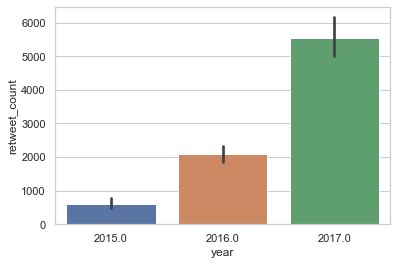

In [44]:
#A bar plot showing the total retweet count of each year
sns.set_theme(style = 'whitegrid')
sns.barplot(x="year", y="retweet_count", data=twitter_df)
plt.show()

### 2. How has the followers count on the WeRateDogs page faired over the years?

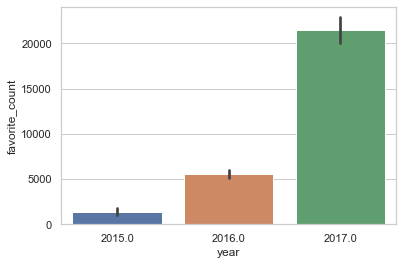

In [45]:
sns.set_theme(style = 'whitegrid')
sns.barplot(x="year", y="favorite_count", data=twitter_df)
plt.show()

### 3. A look into the followers count over the months

In [46]:
#A column is made containing the months from the timestamp data
twitter_df['month'] = twitter_df['timestamp'].dt.month

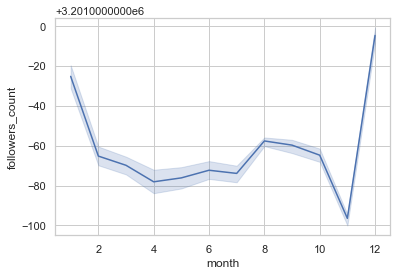

In [47]:
#a line plot is used to indicate the progression of number of followers through the months
sns.lineplot(x="month", y="followers_count", data=twitter_df)
plt.show()

### 4. The most popular dog category

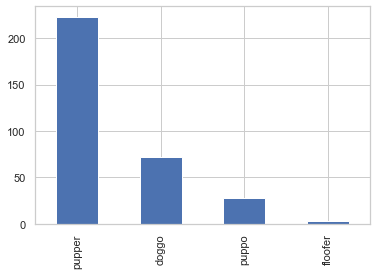

In [48]:
twitter_df.dog_category.value_counts().plot(kind = 'bar');

## Insights/Conclusions

**Insights**
1. WeRateDogs twitter page delivered a steady annual increase in retweets and favorite_count between 2015 and 2017. This means engagement on the page has seen tremendous growth
2. The WeRateDogs twitter page maintained a fairly steady followership annualy with  significant increase in followership occuring in the last month of the year
3. The WeRateDogs twitter page groups dogs into the doggo, floofer, pupper and puppo categories. The data shows that the WeRateDogs page posts more puppers than it does any other category of dogs

**Limitations**
1. The null values in the dataset could not be filled programmatically